In [4]:
from  utils.preprocessing_utils import parse_data,build_dataframe_from_json,set_seed
import utils.plot_utils as pltUtils
from sklearn.preprocessing import MultiLabelBinarizer

# Data loading into a dataframe

In [6]:
set_seed(42)

jsonList = parse_data()

dataframe = build_dataframe_from_json(jsonList)




100%|██████████| 4982/4982 [00:00<00:00, 11379.86it/s]


data : [['2 seconds', '["2\\n2 4\\n3 3\\n3 1"]', '591372383cf3624f69793c41370022de', None, "Numbers $$$1, 2, 3, \\dots n$$$ (each integer from $$$1$$$ to $$$n$$$ once) are written on a board. In one operation you can erase any two numbers $$$a$$$ and $$$b$$$ from the board and write one integer $$$\\frac{a + b}{2}$$$ rounded up instead.You should perform the given operation $$$n - 1$$$ times and make the resulting number that will be left on the board as small as possible. For example, if $$$n = 4$$$, the following course of action is optimal:  choose $$$a = 4$$$ and $$$b = 2$$$, so the new number is $$$3$$$, and the whiteboard contains $$$[1, 3, 3]$$$;  choose $$$a = 3$$$ and $$$b = 3$$$, so the new number is $$$3$$$, and the whiteboard contains $$$[1, 3]$$$;  choose $$$a = 1$$$ and $$$b = 3$$$, so the new number is $$$2$$$, and the whiteboard contains $$$[2]$$$. It's easy to see that after $$$n - 1$$$ operations, there will be left only one number. Your goal is to minimize it.", 'For

# Data analysis

Import utils imported


c:\Users\francois.le-guernic\Desktop\CodeClassification\utils\plot_utils.py:11: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(tagNames,rotation=45,ha="right")


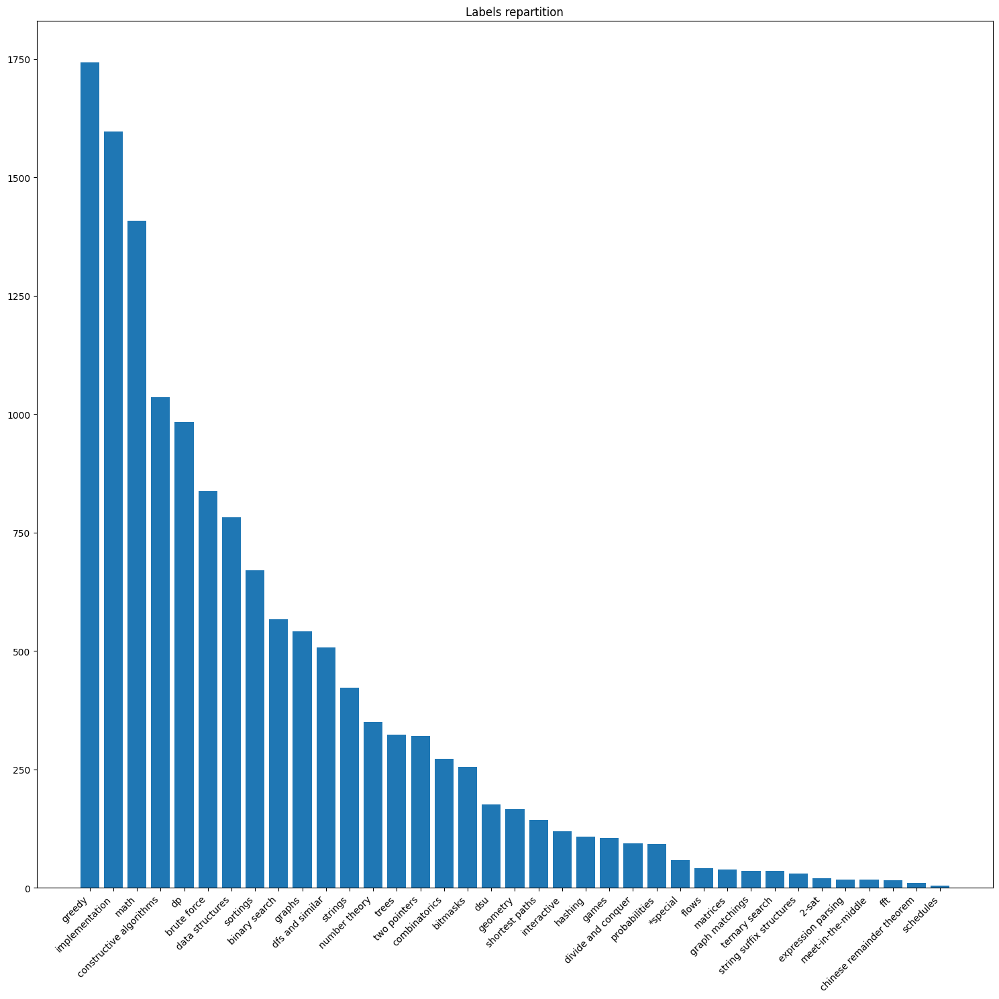

In [ ]:

pltUtils.plot_tags_names_repartition(dataframe["tags"])

In [1]:
X

NameError: name 'X' is not defined

In [32]:
y

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], shape=(4982, 37))

In [34]:
dataframe["lang"].unique()

array(['Python 3', 'PyPy 3', 'Python 2', 'PyPy 2', 'PyPy 3-64'],
      dtype=object)

In [35]:
from sklearn.linear_model import LogisticRegression
from sklearn.multiclass import OneVsRestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from sklearn.feature_extraction.text import TfidfVectorizer

tfidf = TfidfVectorizer(max_features=5000, ngram_range=(1, 2))
X = tfidf.fit_transform(dataframe['prob_desc_description'])

mlb = MultiLabelBinarizer()
y = mlb.fit_transform(dataframe['tags'])

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

clf = OneVsRestClassifier(LogisticRegression(max_iter=1000))
clf.fit(X_train, y_train)

y_pred = clf.predict(X_test)
print(classification_report(y_test, y_pred, target_names=mlb.classes_))

                           precision    recall  f1-score   support

                 *special       0.00      0.00      0.00         8
                    2-sat       0.00      0.00      0.00         4
            binary search       0.00      0.00      0.00        99
                 bitmasks       0.83      0.10      0.18        51
              brute force       0.00      0.00      0.00       175
chinese remainder theorem       0.00      0.00      0.00         0
            combinatorics       0.00      0.00      0.00        45
  constructive algorithms       0.67      0.07      0.12       208
          data structures       0.00      0.00      0.00       135
          dfs and similar       0.59      0.17      0.26        96
       divide and conquer       0.00      0.00      0.00        12
                       dp       0.67      0.02      0.04       198
                      dsu       0.00      0.00      0.00        37
       expression parsing       0.00      0.00      0.00     

C:\Users\francois.le-guernic\AppData\Roaming\Python\Python313\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\francois.le-guernic\AppData\Roaming\Python\Python313\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\francois.le-guernic\AppData\Roaming\Python\Python313\site-packages\sklearn\metrics\_classification.py:1565: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(ave